# Viewing and thresholding statistical maps

By Srinivas B

In [1]:
from pathlib import Path
from glob import glob
from nilearn import image, plotting, datasets
from nilearn.image import threshold_img
from nilearn.glm import threshold_stats_img, cluster_level_inference

icbm152_2009 = datasets.fetch_icbm152_2009()

In [2]:
import warnings
warnings.filterwarnings('ignore')

### Input the z-statistic image

Give specifications for ROI, type of first-level motion correction, model and contrast

In [3]:
results_dir = "/Users/ruchibhutungru/Downloads/SeedCorr-main/results"

roi = "LTPJ"     # Can be "LDLPFC" or "LTPJ"

firstlevel_motioncorrection = "seedCorr2"     # Can be "seedCorr", "seedCorr1 or "seedCorr2"

contrast = "SZP-HC" # Can be "SZP". "DEP". "HC" or "SZPvsHS" or "DEPvsHC" or "intercept" (for zmap0 only)

model = "zmap2"  # zmap2 for "Full" model or zmap1 for "GroupOnly" model

In [4]:
# Get paths to z-stat map, and path to ROI/Seed map

path_zmap = Path(results_dir, roi, firstlevel_motioncorrection, 
                 model + "_" + contrast + "_" + roi + "_" + 
                 firstlevel_motioncorrection + ".nii.gz")

path_seed = Path(roi + "_sphere.nii.gz")

print("Z-stat map : ", path_zmap)
print("ROI map : ", path_seed)

Z-stat map :  /Users/ruchibhutungru/Downloads/SeedCorr-main/results/LTPJ/seedCorr2/zmap2_SZP-HC_LTPJ_seedCorr2.nii.gz
ROI map :  LTPJ_sphere.nii.gz


### Specify type of thresholding, cluster correction

In [6]:
smoothing_fwhm = 6

correction_type = "bonferroni"

alpha_threshold = 0.05

cluster_size_value = 20

title_map =  str(contrast + " thresholded zstat map " +  
                 correction_type + " alpha < " + str(alpha_threshold) + 
                 " cluster size > " + str(cluster_size_value))

### View the ROI/Seed region


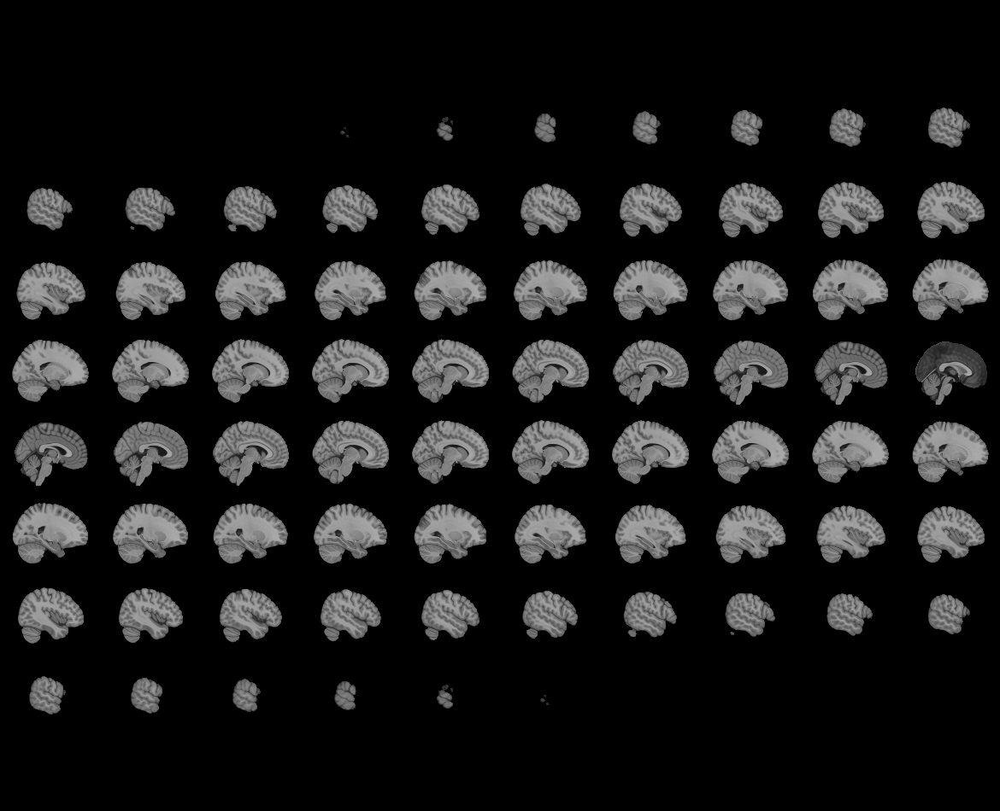
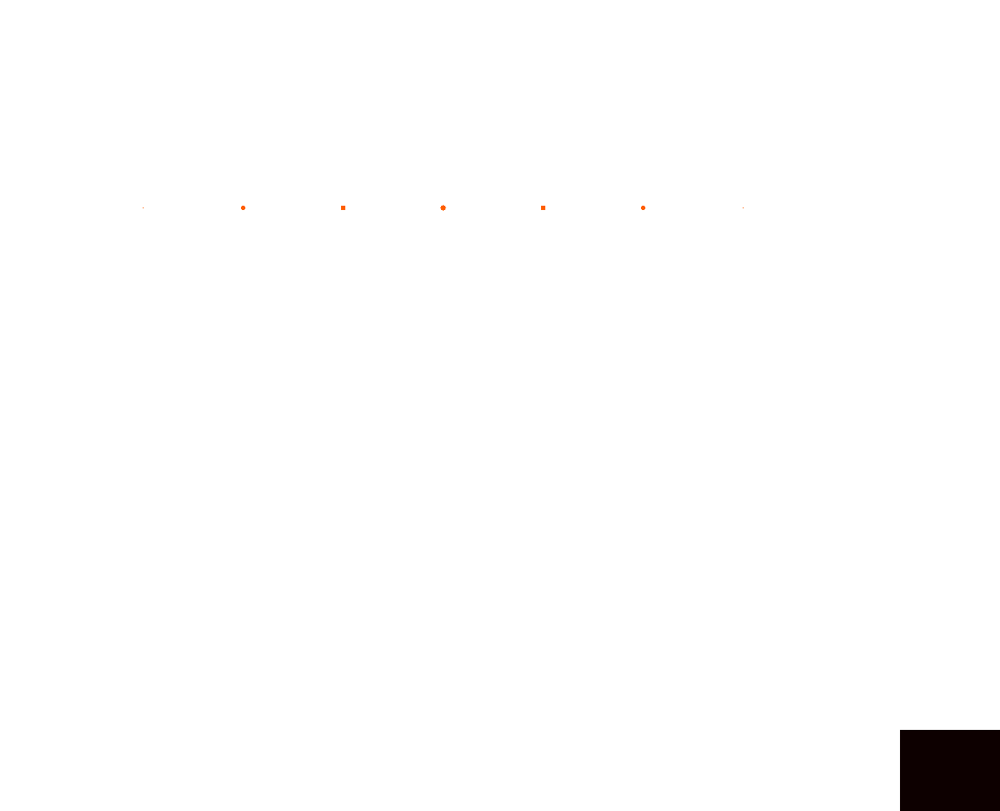

In [21]:
plotting.view_img(path_seed, 
                  title = "Seed at " + roi, 
                  colorbar=False, 
                  draw_cross=False, vmax  = 2)

### Run the codes for thresholding and plotting

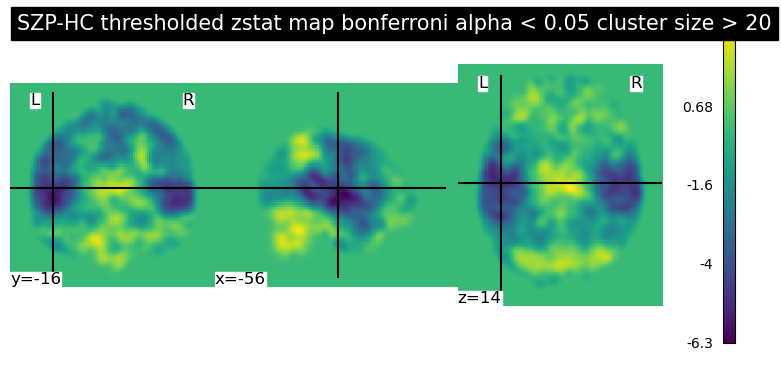

In [8]:
zmap = image.smooth_img(path_zmap, fwhm=smoothing_fwhm)

plotting.plot_img(zmap, colorbar=True, title = title_map)

#### Voxel-level statistical correction

In [9]:
thresholded_map, threshold = threshold_stats_img(
    zmap,
    alpha = alpha_threshold,
    height_control = correction_type,
    cluster_threshold = cluster_size_value,
    two_sided=True)

print("The " + correction_type +  " threshold is z = " + str(round(threshold, 3)))

The bonferroni threshold is z = 5.337


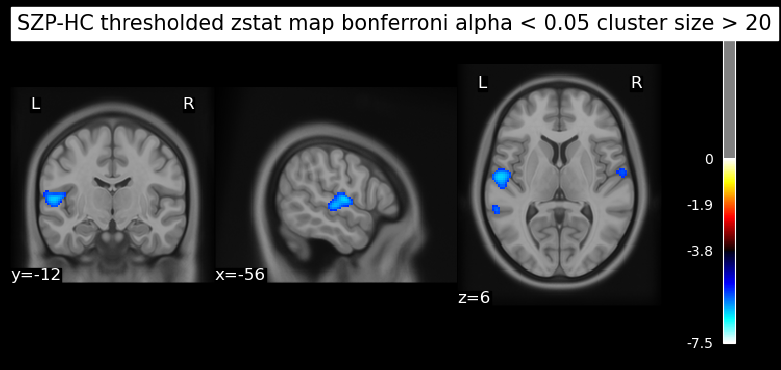

In [10]:
plotting.plot_stat_map(thresholded_map,   
                       threshold = threshold,
                       bg_img= icbm152_2009["t1"],
                       draw_cross=False,
                       title = title_map, 
                       display_mode = 'ortho',
                       black_bg=True, vmin = -7.5)

### Glass Brain

<function nilearn.plotting.img_plotting.show()>

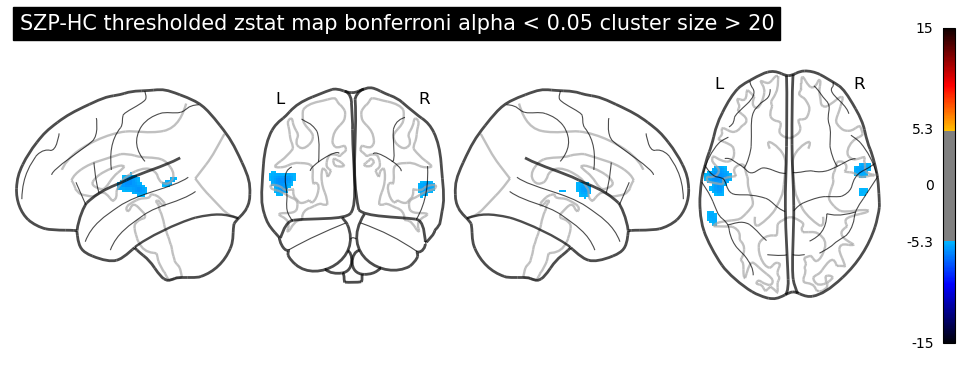

In [22]:
plotting.plot_glass_brain(
    zmap,
    title=title_map,
    display_mode="lyrz",
    plot_abs = False,
    threshold= threshold, vmin = -15,
    colorbar=True)

plotting.show

#### Interactive Map


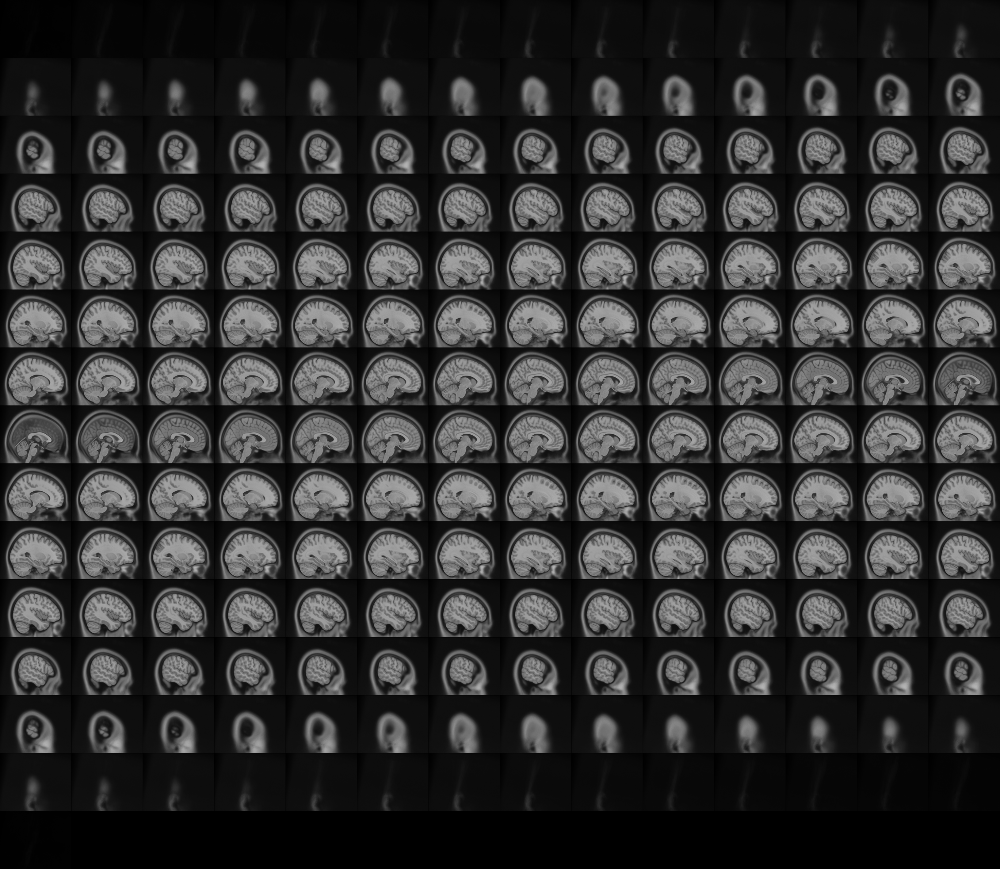
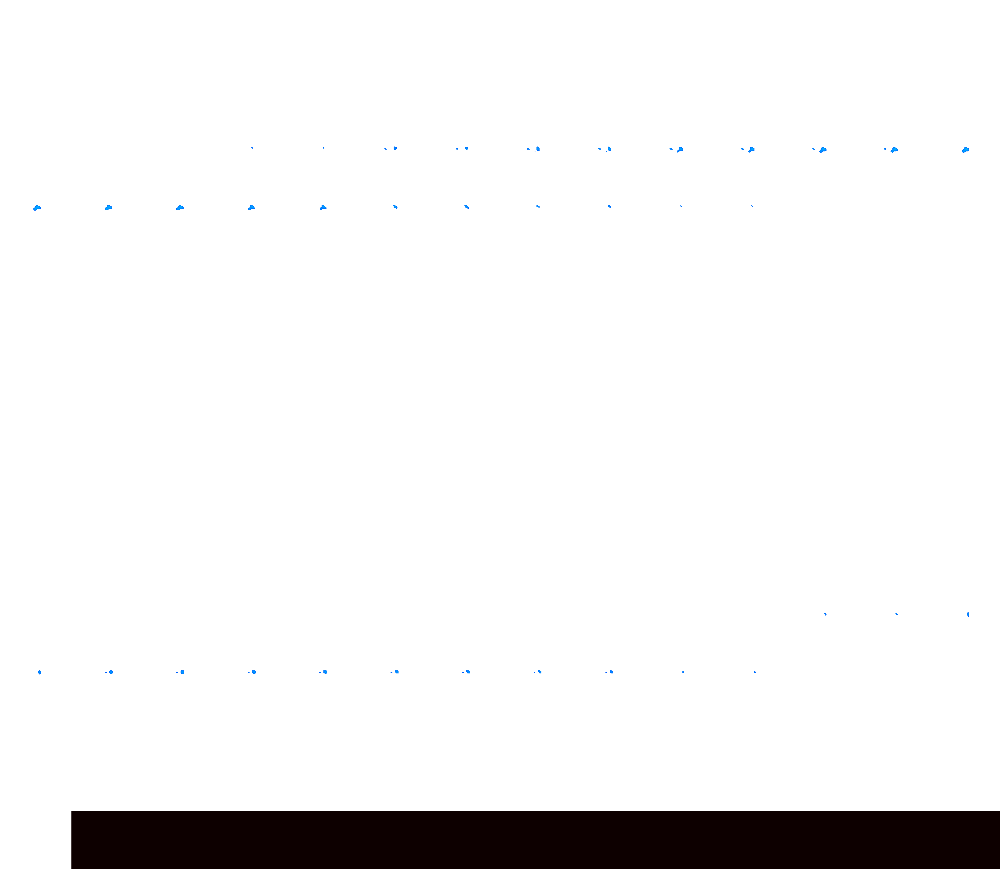

In [29]:
view = plotting.view_img(zmap, 
                         threshold=threshold, vmin = -10,
                         vmax = 10,
                         bg_img= icbm152_2009["t1"],
                         title = title_map)

view

### 3D surface plotting

In [30]:
import numpy as np
from nilearn import surface

fsaverage = datasets.fetch_surf_fsaverage()

curv_left = surface.load_surf_data(fsaverage.curv_left)
curv_left_sign = np.sign(curv_left)

In [31]:
texture = surface.vol_to_surf(zmap, fsaverage.pial_left)

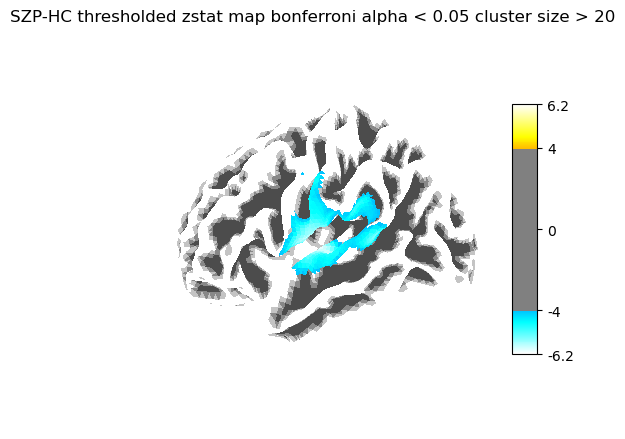

In [33]:
fig = plotting.plot_surf_stat_map(
   fsaverage.white_left, 
    texture, hemi='left',
    title= title_map, colorbar=True,
    threshold= 4, 
    bg_map=curv_left_sign,
)

fig.show()

Using plotting engine plotly.


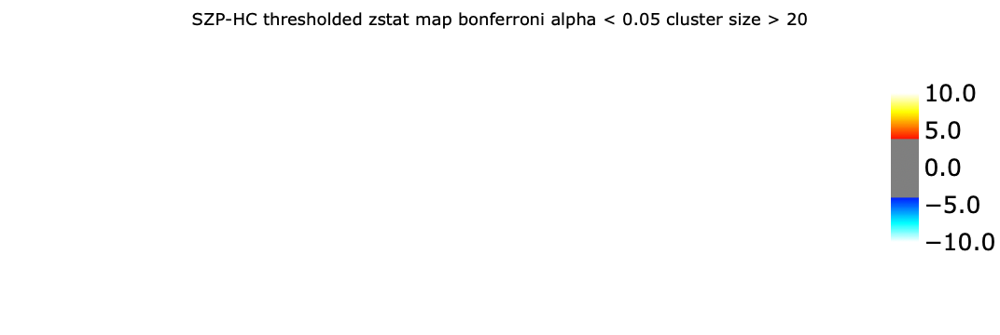

In [44]:
engine = 'plotly'
# If plotly is not installed, use matplotlib
try:
    import plotly.graph_objects as go  # noqa: F401
except ImportError:
    engine = 'matplotlib'

print(f"Using plotting engine {engine}.")

fig = plotting.plot_surf_stat_map(
    fsaverage.white_left, texture, hemi='left',
    title=title_map, colorbar=True, vmin = -10,
    threshold=4, bg_map=curv_left_sign, bg_on_data=True,
    engine=engine, darkness = 0.8  # Specify the plotting engine here
)
fig.show()  # Display the figure as with matplotlib figures

In [36]:
help(plotting.plot_surf_stat_map)

Help on function plot_surf_stat_map in module nilearn.plotting.surf_plotting:

plot_surf_stat_map(surf_mesh, stat_map, bg_map=None, hemi='left', view='lateral', engine='matplotlib', threshold=None, alpha=None, vmin=None, vmax=None, cmap='cold_hot', colorbar=True, symmetric_cbar='auto', cbar_tick_format='auto', bg_on_data=False, darkness=0.7, title=None, title_font_size=18, output_file=None, axes=None, figure=None, avg_method=None, **kwargs)
    Plot a stats map on a surface :term:`mesh` with optional background.
    
    .. versionadded:: 0.3
    
    Parameters
    ----------
    surf_mesh : str or list of two numpy.ndarray or Mesh
        Surface :term:`mesh` geometry, can be a file (valid formats are
        .gii or Freesurfer specific files such as .orig, .pial,
        .sphere, .white, .inflated) or
        a list of two Numpy arrays, the first containing the x-y-z
        coordinates of the :term:`mesh` :term:`vertices<vertex>`,
        the second containing the indices (into coo

In [43]:
help(plotting.plot_surf)

Help on function plot_surf in module nilearn.plotting.surf_plotting:

plot_surf(surf_mesh, surf_map=None, bg_map=None, hemi='left', view='lateral', engine='matplotlib', cmap=None, symmetric_cmap=False, colorbar=False, avg_method=None, threshold=None, alpha=None, bg_on_data=False, darkness=0.7, vmin=None, vmax=None, cbar_vmin=None, cbar_vmax=None, cbar_tick_format='auto', title=None, title_font_size=18, output_file=None, axes=None, figure=None)
    Plot surfaces with optional background and data.
    
    .. versionadded:: 0.3
    
    Parameters
    ----------
    surf_mesh : str or list of two numpy.ndarray or Mesh
        Surface :term:`mesh` geometry, can be a file (valid formats are
        .gii or Freesurfer specific files such as .orig, .pial,
        .sphere, .white, .inflated) or
        a list of two Numpy arrays, the first containing the x-y-z coordinates
        of the :term:`mesh` :term:`vertices<vertex>`,
        the second containing the indices (into coords)
        of t